https://infercnvpy.readthedocs.io/en/latest/notebooks/tutorial_3k.html
# CNV analysis

In [1]:
import os
import scanpy as sc
import infercnvpy as cnv
import matplotlib.pyplot as plt
import pandas as pd
import warnings
import numpy as np
import seaborn as sns
from pyensembl import EnsemblRelease
from matplotlib.backends.backend_pdf import PdfPages

warnings.simplefilter("ignore")

sc.settings.set_figure_params(figsize=(5, 5))

data_path = "./raw_data/"
graphics_path = "./graphics"

os.makedirs(f"{graphics_path}/CNV", exist_ok=True)

In [2]:
data_path = "./data/"
adata_annotated = sc.read_h5ad(os.path.join(data_path, "adata_annotated_full.h5ad"))

In [3]:
# Load EnsemblRelease for GRCh38

data = EnsemblRelease(110)

adata_annotated.var["gene_names"] = adata_annotated.var.index
#adata_annotated.var.set_index("gene_ids", inplace=True)

adata_annotated.var.set_index('gene_ids', inplace=True)

unmatched_genes = []

for gene_id in adata_annotated.var.index:
    try:
        # Fetch gene information
        gene = data.gene_by_id(gene_id)
        
        # Assign chromosome, start, and end positions
        adata_annotated.var.at[gene_id, "chromosome"] = f"chr{gene.contig}"
        adata_annotated.var.at[gene_id, "start"] = gene.start
        adata_annotated.var.at[gene_id, "end"] = gene.end
    except Exception as e:
        unmatched_genes.append(gene_id)

print(f"Unmatched genes: {len(unmatched_genes)}")
print(adata_annotated.var[["chromosome", "start", "end"]].head())

Unmatched genes: 401
                chromosome    start       end
gene_ids                                     
ENSG00000243485       chr1  29554.0   31109.0
ENSG00000237613       chr1  34554.0   36081.0
ENSG00000186092       chr1  65419.0   71585.0
ENSG00000238009       chr1  89295.0  133723.0
ENSG00000239945       chr1  89551.0   91105.0


In [4]:
adata_annotated.obs["cell_type"] = adata_annotated.obs["manual_annotation"]
print(adata_annotated.obs["cell_type"].value_counts())

cell_type
Monocytes                        8682
NK cells                         8518
Anti-inflammatory macrophages    8335
B cells                          4616
T cells                          3748
mo-DC2                           3667
TAM macrophages                  2337
Mast cells                       1989
Alveolar macrophages             1288
DC1                              1208
None                             1084
cDC2                             1063
CAML                              650
mature DC                         325
Plasmacytoid DC                    32
Name: count, dtype: int64


In [5]:
adata_annotated.var["chromosome"].unique()

array(['chr1', nan, 'chr2', 'chr3', 'chr4', 'chr5', 'chr6', 'chr7',
       'chrX', 'chr8', 'chr9', 'chr11', 'chr10', 'chr12', 'chr13',
       'chr14', 'chr15', 'chr16', 'chr17', 'chr18', 'chr20', 'chr19',
       'chrY', 'chr22', 'chr21', 'chrMT', 'chrKI270728.1',
       'chrKI270727.1', 'chrGL000009.2', 'chrGL000194.1', 'chrGL000195.1',
       'chrGL000219.1', 'chrKI270734.1', 'chrGL000213.1', 'chrGL000218.1',
       'chrKI270731.1', 'chrKI270721.1', 'chrKI270726.1', 'chrKI270711.1',
       'chrKI270713.1'], dtype=object)

  0%|          | 0/48 [00:00<?, ?it/s]

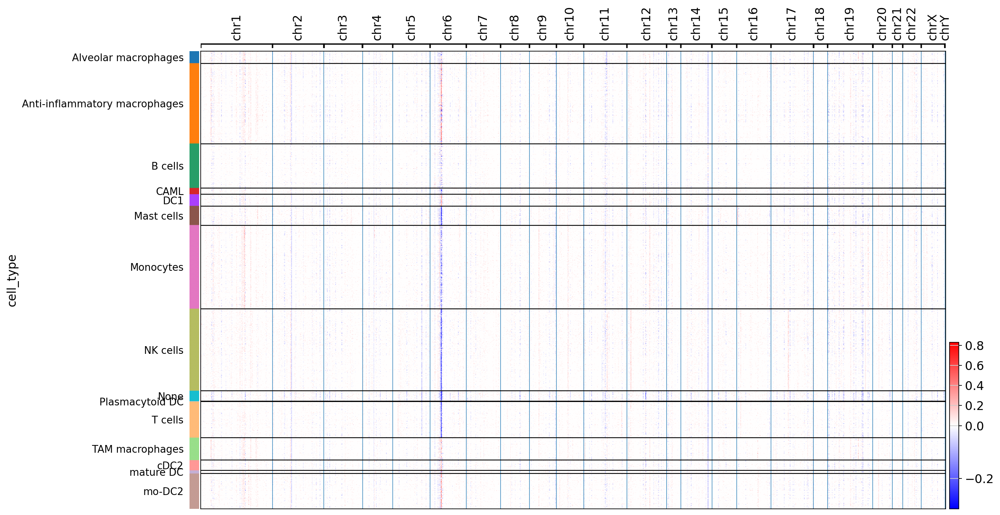

In [6]:
cnv.tl.infercnv(
    adata_annotated,
    window_size=50,
    exclude_chromosomes=('chrMT', 'chrKI270728.1', 'chrKI270727.1', 'chrGL000009.2', 'chrGL000194.1', 'chrGL000195.1',
    'chrGL000219.1', 'chrKI270734.1', 'chrGL000213.1', 'chrGL000218.1', 'chrKI270731.1', 'chrKI270721.1', 'chrKI270726.1', 'chrKI270711.1', 'chrKI270713.1'),
    chunksize=1000,
    reference_key="cell_type",
    reference_cat=["B cells"])

cnv.pl.chromosome_heatmap(adata_annotated, groupby="cell_type")

  0%|          | 0/48 [00:00<?, ?it/s]

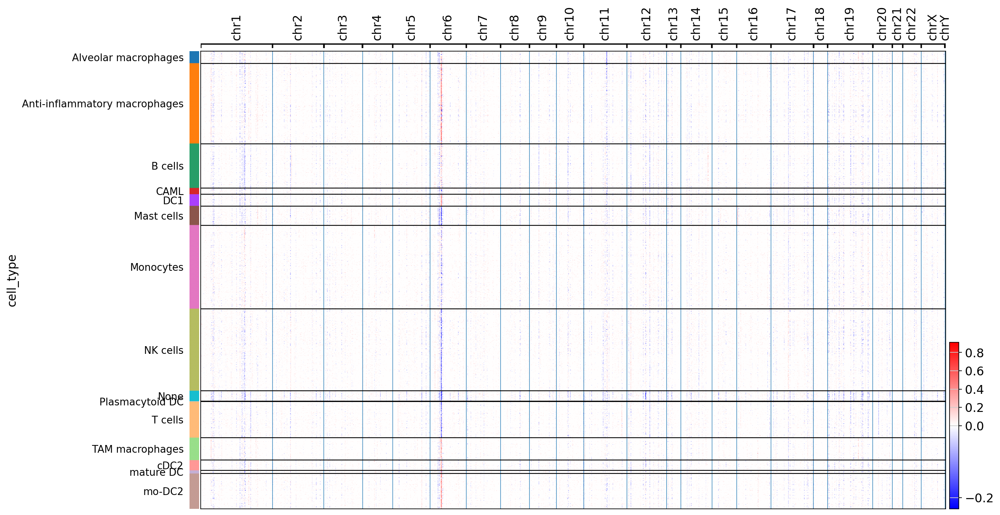

In [7]:
# Calculate mean gene expression in cells sampled in healthy tissue (background) for reference

adata_reference = adata_annotated[adata_annotated.obs["Sampling site"] != "tumor"].copy()
reference_array = np.mean(adata_reference.X, axis=0)

cnv.tl.infercnv(
    adata_annotated,
    window_size=50,
    reference=reference_array,
    exclude_chromosomes=('chrMT', 'chrKI270728.1', 'chrKI270727.1', 'chrGL000009.2', 'chrGL000194.1', 'chrGL000195.1',
    'chrGL000219.1', 'chrKI270734.1', 'chrGL000213.1', 'chrGL000218.1', 'chrKI270731.1', 'chrKI270721.1', 'chrKI270726.1', 'chrKI270711.1', 'chrKI270713.1'),
    chunksize=1000)

cnv.pl.chromosome_heatmap(adata_annotated, groupby="cell_type")


In [8]:
# Clustering by CNV profiles and identifying tumor cells

cnv.tl.pca(adata_annotated)
cnv.pp.neighbors(adata_annotated)
cnv.tl.leiden(adata_annotated)


In [9]:
sc.tl.dendrogram(adata_annotated, groupby="cnv_leiden")


categories: 0, 1, 2, etc.
var_group_labels: chr1, chr2, chr3, etc.


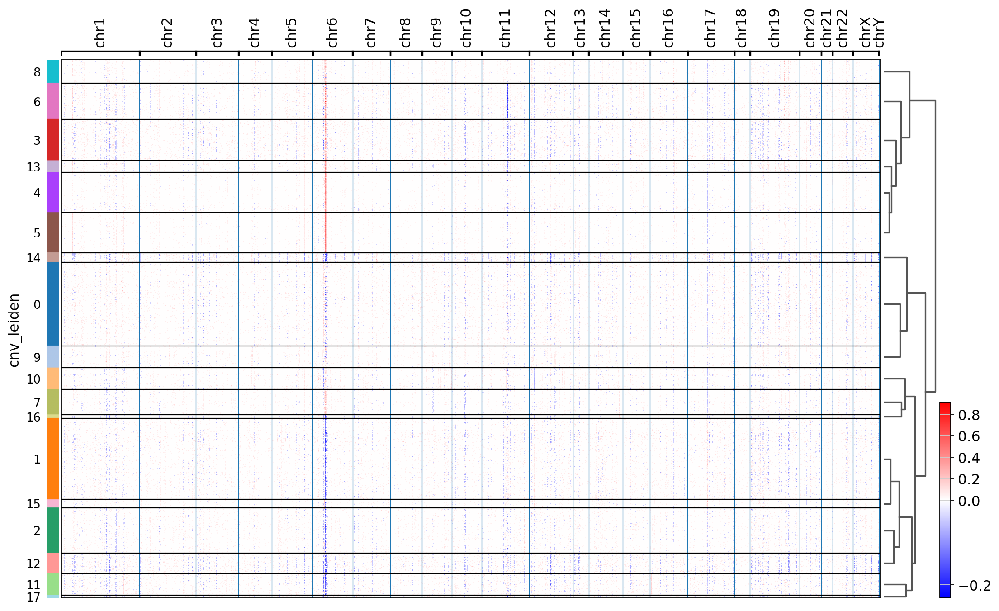

In [10]:
cnv.pl.chromosome_heatmap(adata_annotated, groupby="cnv_leiden", dendrogram=True)

... storing 'chromosome' as categorical


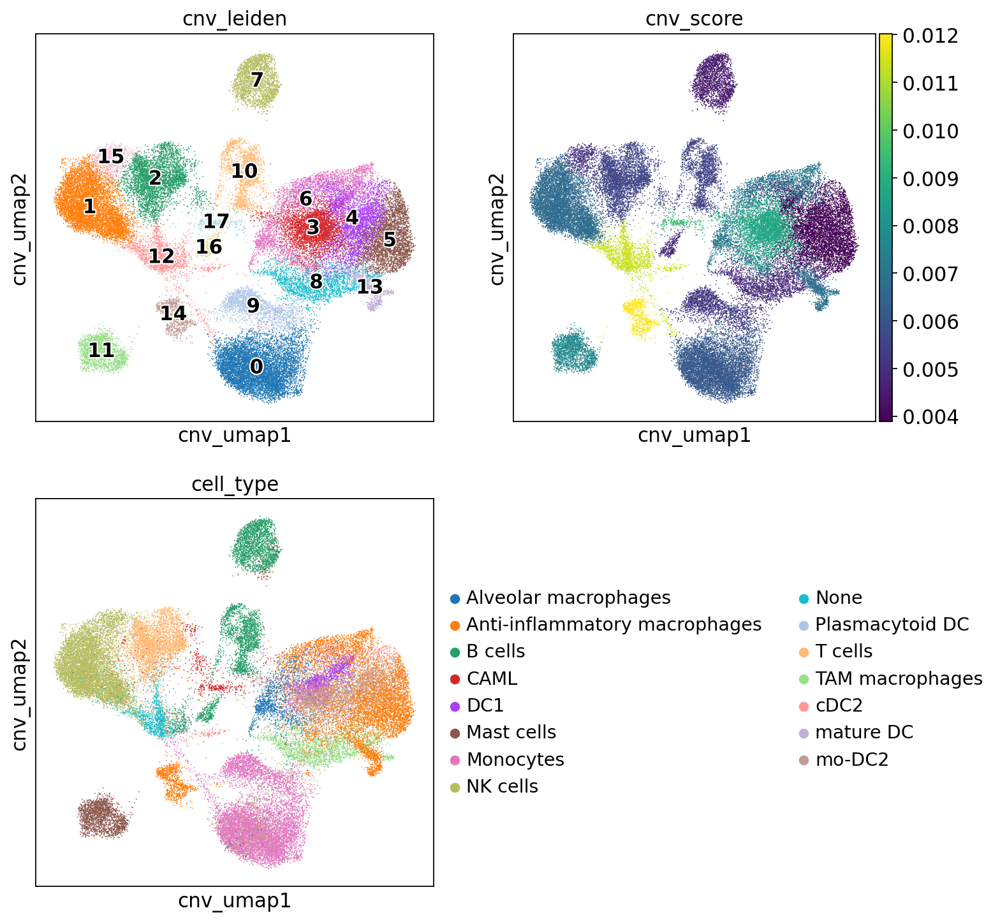

In [11]:
cnv.tl.umap(adata_annotated)
cnv.tl.cnv_score(adata_annotated)

#The UMAP plot consists of a large blob of “normal” cells and several smaller clusters with distinct CNV profiles. Except for cluster “12”, which consists of ciliated cells, the isolated clusters are all epithelial cells. These are likely tumor cells and each cluster represents an individual sub-clone.

fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(11, 11))
ax4.axis("off")
cnv.pl.umap(
    adata_annotated,
    color="cnv_leiden",
    legend_loc="on data",
    legend_fontoutline=2,
    ax=ax1,
    show=False,
)
cnv.pl.umap(adata_annotated, color="cnv_score", ax=ax2, show=False)
cnv.pl.umap(adata_annotated, color="cell_type", ax=ax3)


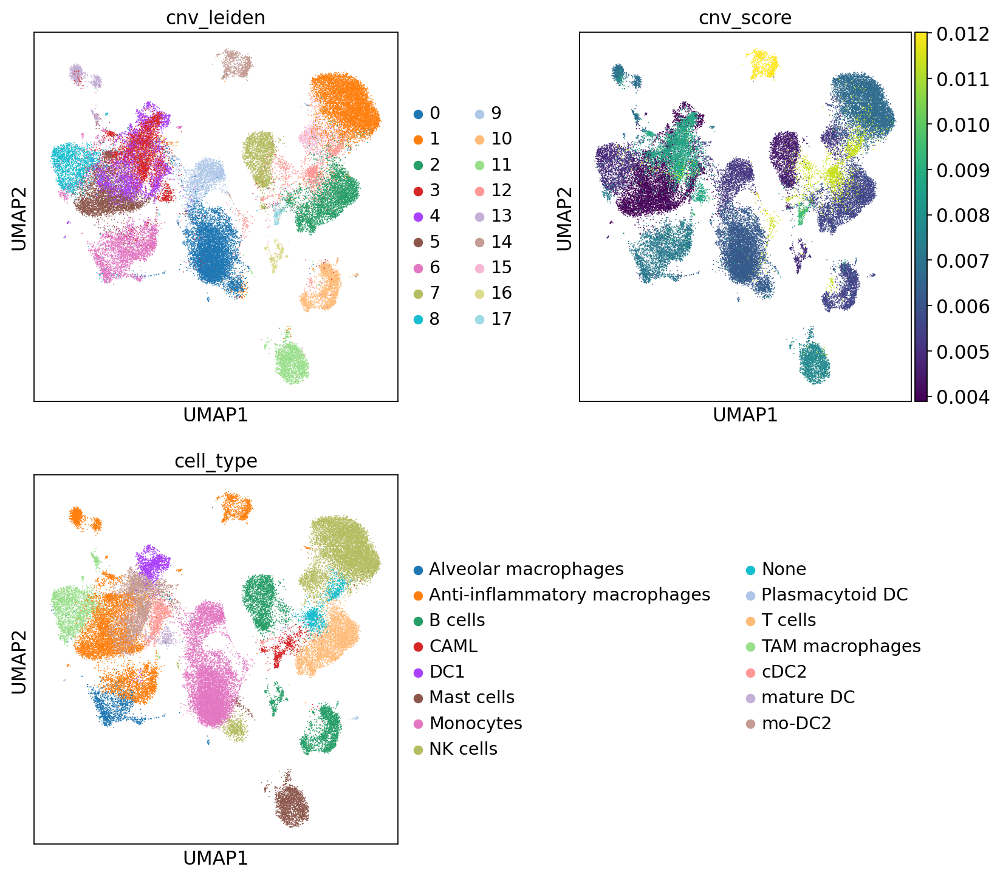

<Figure size 400x400 with 0 Axes>

In [19]:
#We can also visualize the CNV score and clusters on the transcriptomics-based UMAP plot. Again, we can see that there are subclusters of epithelial cells that belong to a distinct CNV cluster, and that these clusters tend to have the highest CNV score.

output_path = os.path.join(graphics_path, "CNV", "CNV_Scores_full.pdf")

with PdfPages(output_path) as pdf:
    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(12, 11), gridspec_kw={"wspace": 0.5})
    ax4.axis("off")
    sc.pl.umap(adata_annotated, color="cnv_leiden", ax=ax1, show=False)
    sc.pl.umap(adata_annotated, color="cnv_score", ax=ax2, show=False)
    sc.pl.umap(adata_annotated, color="cell_type", ax=ax3)
    
    plt.tight_layout()
    pdf.savefig(fig)
    plt.close(fig) 


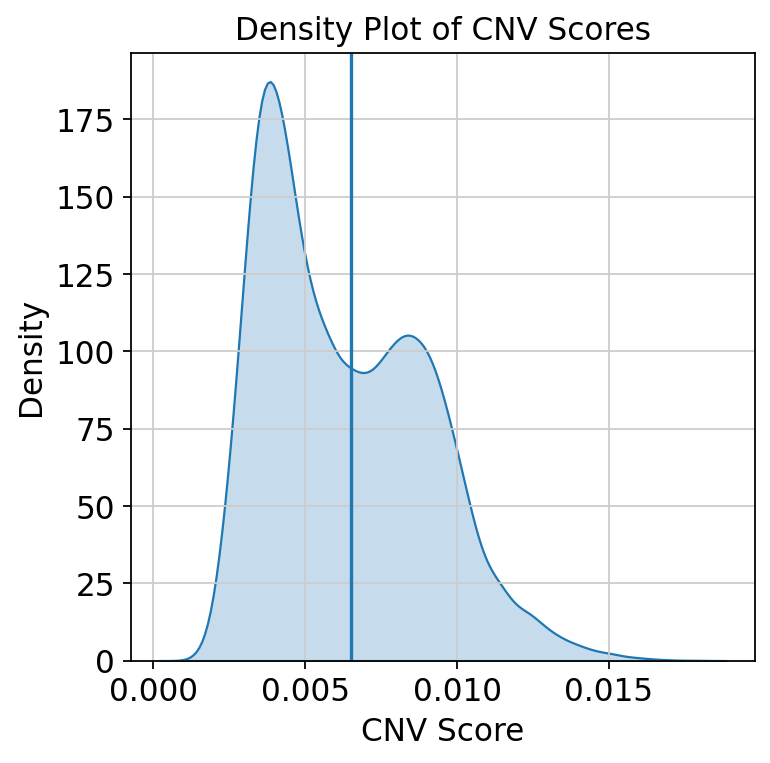

In [13]:

cnv_matrix = adata_annotated.obsm["X_cnv"].toarray()

cnv_scores_mean = np.mean(np.abs(cnv_matrix), axis=1)

adata_annotated.obs["cnv_score_mean"] = cnv_scores_mean

sns.kdeplot(data=adata_annotated.obs, x="cnv_score_mean", fill=True)
plt.xlabel("CNV Score")
plt.ylabel("Density")
plt.title("Density Plot of CNV Scores")
plt.axvline(x=0.0065)

plt.savefig(os.path.join(graphics_path, "CNV", "CNV_Scores_threshhold.png"))
plt.show()

In [14]:
# Classify cells based on CNV score

adata_annotated.obs["cnv_status"] = np.where(
    adata_annotated.obs["cnv_score_mean"] < 0.0065, "normal", "tumor")

print(adata_annotated.obs["cnv_status"].value_counts())


cnv_status
normal    26948
tumor     20594
Name: count, dtype: int64


... storing 'cnv_status' as categorical


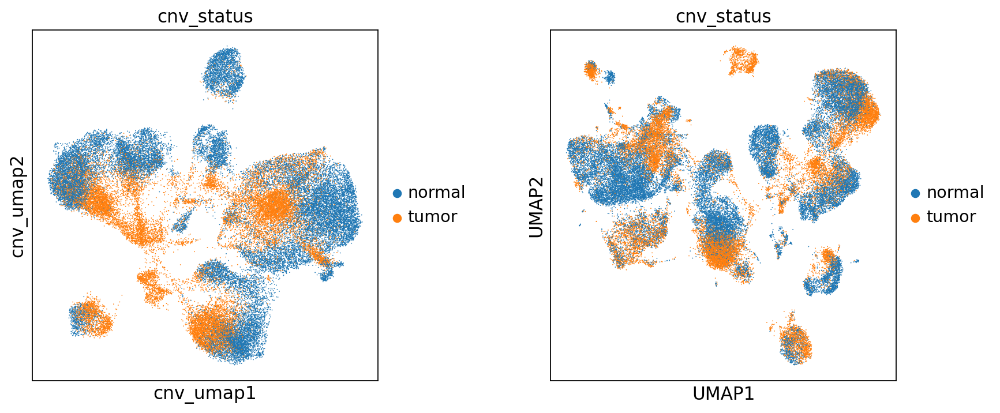

In [15]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5), gridspec_kw={"wspace": 0.5})
cnv.pl.umap(adata_annotated, color="cnv_status", ax=ax1, show=False)
sc.pl.umap(adata_annotated, color="cnv_status", ax=ax2)

In [16]:
adata_annotated.write(os.path.join(data_path, "adata_cnv_full.h5ad"))

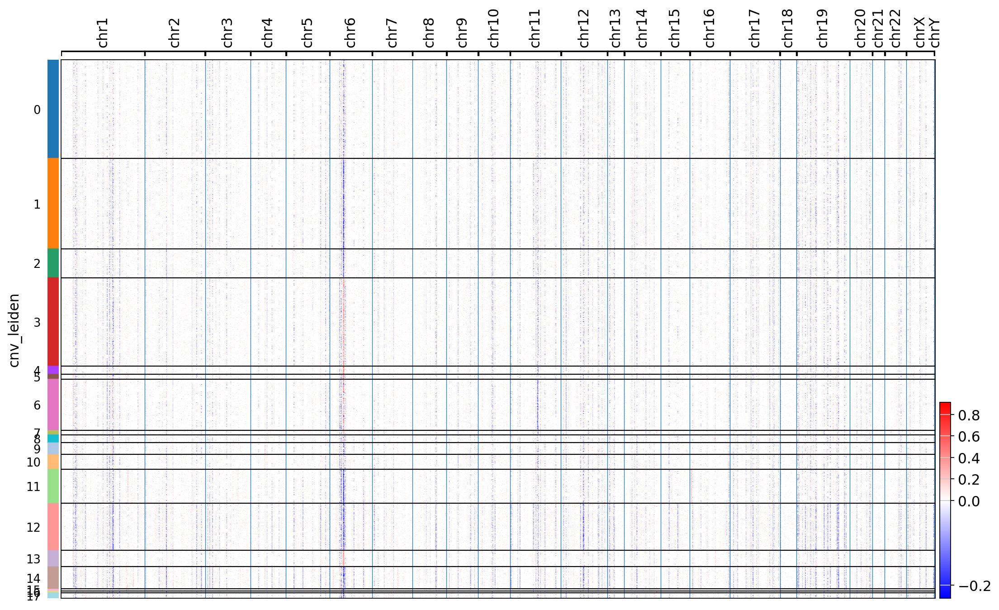

In [17]:
# Now, we can plot the CNV heatmap for tumor and normal cells separately:

cnv.pl.chromosome_heatmap(adata_annotated[adata_annotated.obs["cnv_status"] == "tumor", :])

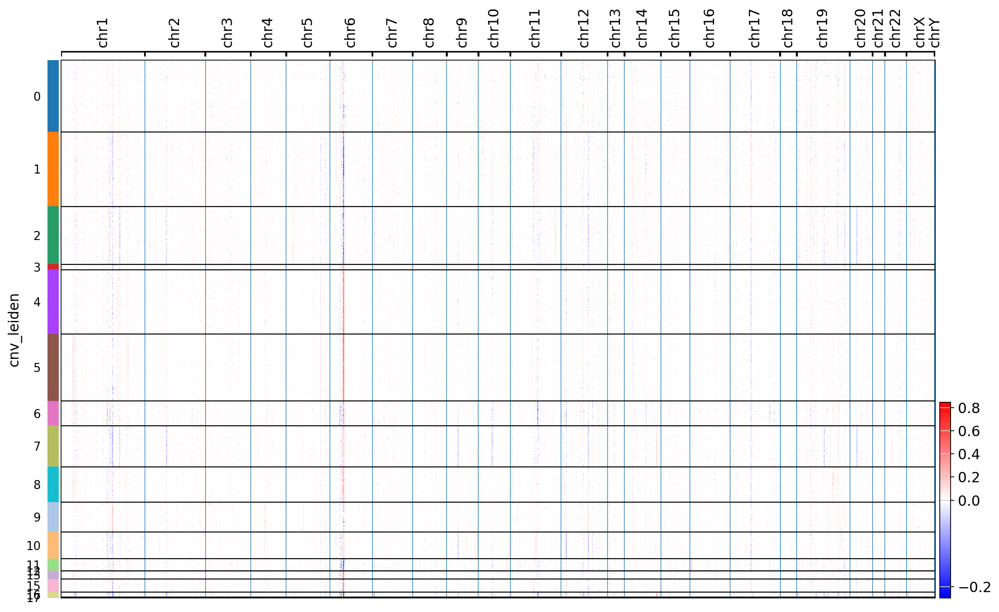

In [18]:
cnv.pl.chromosome_heatmap(adata_annotated[adata_annotated.obs["cnv_status"] == "normal", :])